<a href="https://colab.research.google.com/github/felfrom/GEOL0069/blob/Final-Project/sen2bandanalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GEOL0069: Artificial Intelligence For Earth Observation Final Project

# **Data manipulation**

### Mount google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Install packages

In [ ]:
!pip install rasterio

### Import packages

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from pyproj import Proj, transform
from rasterio.transform import xy
from rasterio import open as rio_open
from rasterio.enums import Resampling
from skimage import measure
from rasterio.warp import reproject, Resampling
from scipy.ndimage import maximum_filter, minimum_filter
from sklearn.mixture import GaussianMixture


# **Extract bands from Sentinel 2 data**
### We are using 60m resolution data

In [ ]:
# Paths to the band images
path = '/content/drive/MyDrive/GEOL0069/Final Project/Data/' #path to the data in my drive
base_path = "S2A_MSIL2A_20241225T142711_N0511_R053_T18GXN_20241225T195551.SAFE/GRANULE/L2A_T18GXN_A049671_20241225T143755/IMG_DATA/R60m/" #path from data folder to sentinel 2 data
#Paths of bands to extract
bands_paths = {
    'B1': path + base_path + 'T18GXN_20241225T142711_B01_60m.jp2',
    'B2': path + base_path + 'T18GXN_20241225T142711_B02_60m.jp2',
    'B3': path + base_path + 'T18GXN_20241225T142711_B03_60m.jp2',
    'B4': path + base_path + 'T18GXN_20241225T142711_B04_60m.jp2',
    'B5': path + base_path + 'T18GXN_20241225T142711_B05_60m.jp2',
    'B6': path + base_path + 'T18GXN_20241225T142711_B06_60m.jp2',
    'B7': path + base_path + 'T18GXN_20241225T142711_B07_60m.jp2',
    'B8A': path + base_path + 'T18GXN_20241225T142711_B8A_60m.jp2',
    'B9': path + base_path + 'T18GXN_20241225T142711_B09_60m.jp2',
    'B11': path + base_path + 'T18GXN_20241225T142711_B11_60m.jp2',
    'B12': path + base_path + 'T18GXN_20241225T142711_B12_60m.jp2'
}
band_data = {}  #Create a dictionary to contain band data
for band in ['B1','B2','B3','B4','B5','B6','B7','B8A','B9','B11','B12']: #Extract band data from file paths
    filename = f"T18GXN_20241225T142711_{band}_60m.jp2"
    band_path = path + base_path + filename
    with rasterio.open(bands_paths[band]) as src:
        band_data[band] = src.read(1)

# Now band_data contains all bands loaded at 60m, aligned and same shape
print({k: v.shape for k, v in band_data.items()})

band_stack = np.dstack([band_data[band] for band in ['B1','B2','B3','B4','B5','B6','B7','B8A','B9','B11','B12']]) #Stack band data

valid_data_mask = np.all(band_stack > 0, axis=2) #Ensure data is valid

# Reshape for GMM, only including valid data
X = band_stack[valid_data_mask].reshape((-1, 3))

s2_filename = path + 'S2A_MSIL2A_20241225T142711_N0511_R053_T18GXN_20241225T195551.SAFE/GRANULE/L2A_T18GXN_A049671_20241225T143755/IMG_DATA/R60m/T18GXN_20241225T142711_B04_60m.jp2'

# Read the Sentinel-2 image and its geospatial information
with rasterio.open(s2_filename) as src:
    # Read the raster data and the affine transformation
    s2_data = src.read(1)
    transform_matrix = src.transform
    # Get the spatial reference system (CRS)
    srs = src.crs
# Get the rows and columns
rows, cols = s2_data.shape

# Create meshgrid of row and col indices
row_indices, col_indices = np.meshgrid(np.arange(rows), np.arange(cols), indexing='ij')

# Use rasterio.transform.xy to get coordinates
x_s2, y_s2 = transform_matrix * (col_indices, row_indices)

rows, cols = s2_data.shape

# Convert grid of X,Y values to latitude/longitude
in_proj = Proj(init=str(srs))  # Initialize projection from CRS
out_proj = Proj(proj='latlong')  # Initialize projection for latitude/longitude

{'B1': (1830, 1830), 'B2': (1830, 1830), 'B3': (1830, 1830), 'B4': (1830, 1830), 'B5': (1830, 1830), 'B6': (1830, 1830), 'B7': (1830, 1830), 'B8A': (1830, 1830), 'B9': (1830, 1830), 'B11': (1830, 1830), 'B12': (1830, 1830)}


/usr/local/lib/python3.11/dist-packages/pyproj/crs/crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


# Downsample Band 8 from 10m resolution to 60m resolution
### Band 8 is only available in 10m resolution, so we will down sample to 60m resolution for consistency

In [ ]:


# Open the 10m band
with rasterio.open('/content/drive/MyDrive/GEOL0069/Final Project/Data/S2A_MSIL2A_20241225T142711_N0511_R053_T18GXN_20241225T195551.SAFE/GRANULE/L2A_T18GXN_A049671_20241225T143755/IMG_DATA/R10m/T18GXN_20241225T142711_B08_10m.jp2') as src:
    # Calculate the shape for 60m resolution
    new_height = src.height // 6
    new_width = src.width // 6

    # Resample using average
    B8_60m = src.read(
        1,
        out_shape=(new_height, new_width),
        resampling=Resampling.average
    )

    # Calculate new transform
    new_transform = src.transform * src.transform.scale(
        (src.width / new_width),
        (src.height / new_height)
    )

# Visualise each band

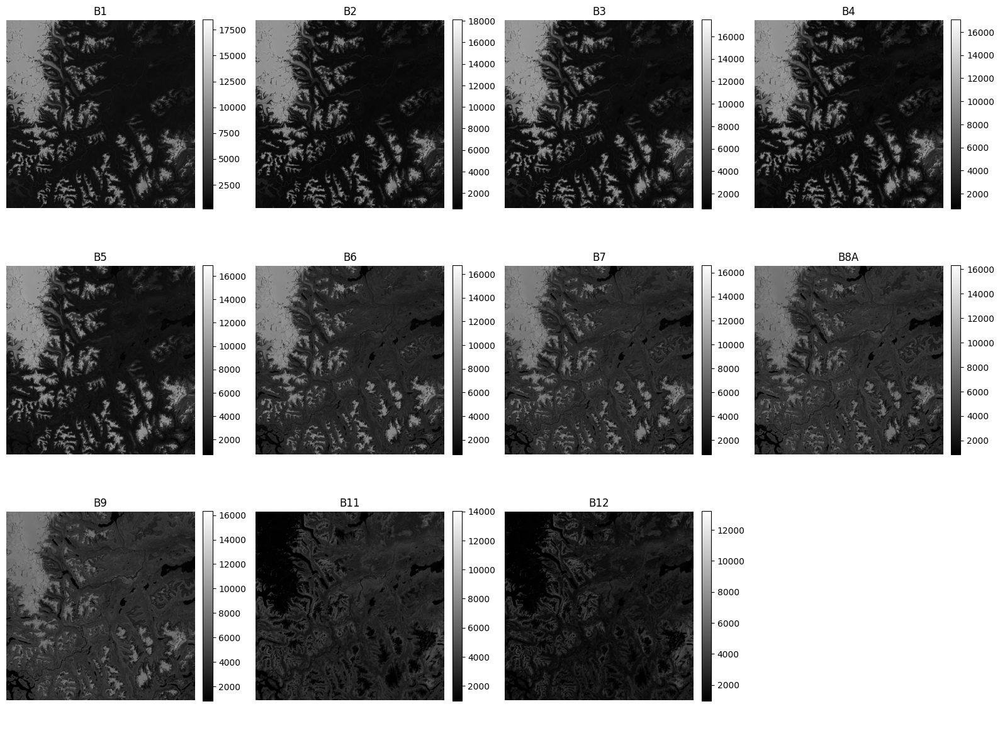

In [ ]:
#Bands we want to visualise
bands_to_plot = ['B1','B2','B3','B4','B5','B6','B7','B8A','B9','B11','B12']
#Create figure to display 12 bands
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 12))
axes = axes.flatten()  # flatten to easily iterate

for i, band in enumerate(bands_to_plot):
    ax = axes[i]
    img = band_data[band]
    im = ax.imshow(img, cmap='gray')
    ax.set_title(band)
    ax.axis('off')
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)  # small colorbar per subplot

# If there are unused subplots, hide them
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


# Visualise with RGB

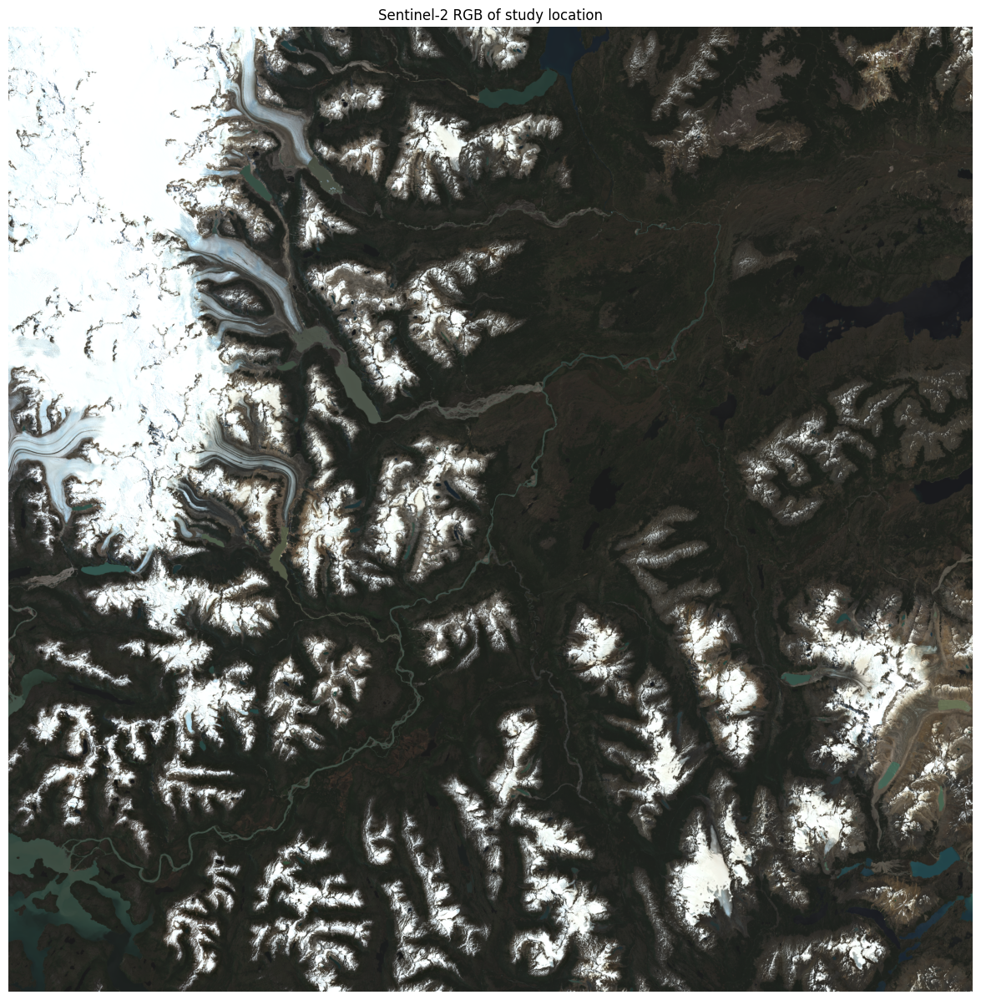

In [ ]:
band_datargb = []
for band in ['B4', 'B3', 'B2']: #Bands 2, 3 and 4 correspond to RGB
    with rasterio.open(bands_paths[band]) as src:
        band_crop = src.read(1)
        band_datargb.append(band_crop)

# Stack and normalize
band_stackrgb = np.dstack(band_datargb).astype(np.float32) / 10000
band_stackrgb = np.clip(band_stackrgb, 0, 1)

# Plot
plt.figure(figsize=(15, 15))
plt.tight_layout()
plt.imshow(band_stackrgb)
plt.title("Sentinel-2 RGB of study location")
plt.axis('off')
plt.show()

# **Calculate NDVI as a proxy for vegetation**


$$
\text{NDVI} = \frac{\text{NIR} - \text{RED}}{\text{NIR} + \text{RED}} = \frac{B8 - B4}{B8 + B4}
$$

### Negative values correspond to water, close to zero (-0.1,0.1) generally correspond to barren areas of rock, sand, or snow. Low, positive values represent shrub and grassland (approximately 0.2 to 0.4), while high values indicate temperate and tropical rainforests (values approaching 1).

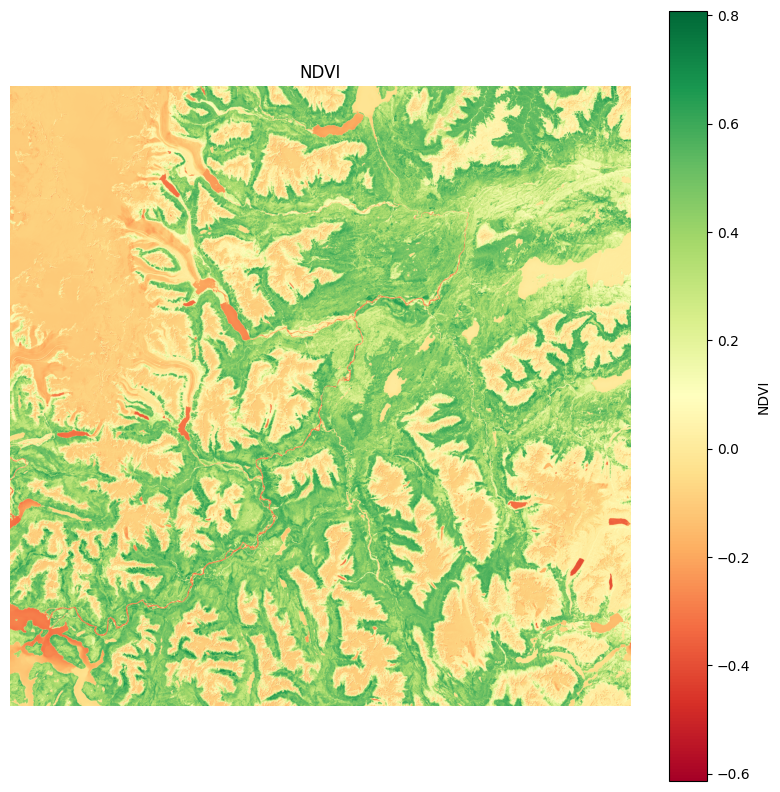

In [ ]:
#scale the bands to true values (0-1)
B8 = B8_60m/ 10000.0
B4 = band_data['B4']/ 10000.0
epsilon = 1e-6  #add an epsilon term to avoid 0 values on the denominator
NDVI = (B8 - B4) / (B8 + B4 + epsilon)
plt.figure(figsize=(10, 10))
plt.title('NDVI')
plt.imshow(NDVI, cmap='RdYlGn')
plt.colorbar(label='NDVI')
plt.axis('off')
plt.show()

# Visualise different NDVI thresholds

<ipython-input-133-e0ad362baca9>:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbar


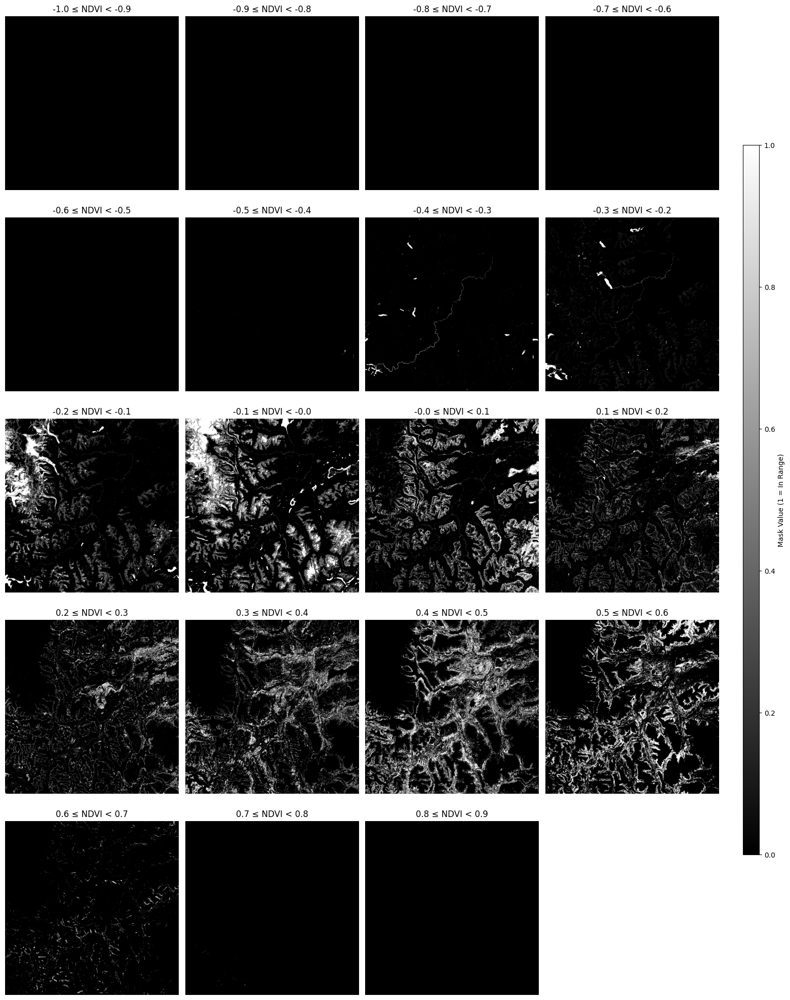

In [ ]:

# Define NDVI range bins
ndvi_min = -1.0
ndvi_max = 1.0
bin_width = 0.1
ndvi_bins = np.arange(ndvi_min, ndvi_max, bin_width)

# Determine layout: 4 columns, enough rows to fit all bins
n_bins = len(ndvi_bins) - 1
n_cols = 4
n_rows = int(np.ceil(n_bins / n_cols))

# Create figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()  # Flatten in case of 2D array

# Plot each bin in a subplot
for i in range(n_bins):
    lower = ndvi_bins[i]
    upper = ndvi_bins[i + 1]
    ndvi_mask = (NDVI >= lower) & (NDVI < upper)
    ndvi_highlight = np.where(ndvi_mask, 1, 0)

    ax = axes[i]
    im = ax.imshow(ndvi_highlight, cmap='gray')
    ax.set_title(f'{lower:.1f} ≤ NDVI < {upper:.1f}')
    ax.axis('off')

# Remove any unused subplots
for j in range(n_bins, len(axes)):
    fig.delaxes(axes[j])

# Add a single colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(im, cax=cbar_ax, label='Mask Value (1 = In Range)')

plt.tight_layout(rect=[0, 0, 0.9, 1])  # Leave space for colorbar
plt.show()


# Define a mask from an NDVI threshold
### We determine vegetation as NDVI values greater than 0.2

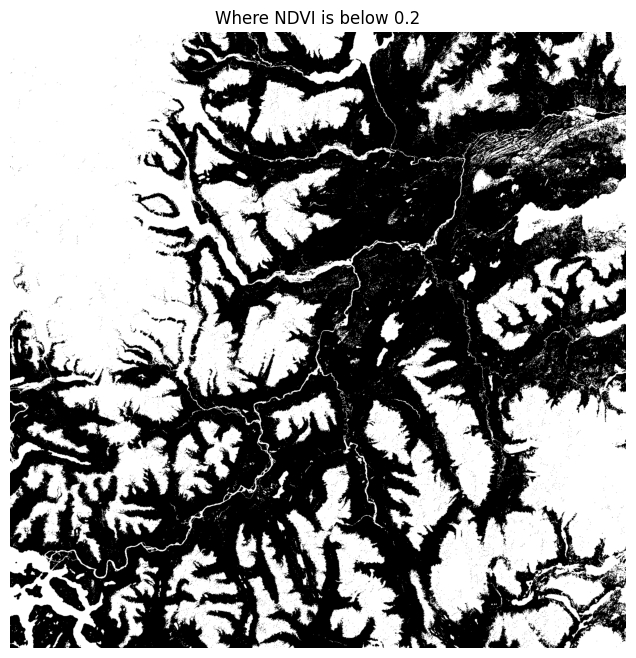

In [ ]:
NDVIvegmask = (NDVI >= 0.2) #create NDVI mask
NDVIveghighlight = np.where(NDVIvegmask, 0, 1)  #create binary 1 or 0 for if the NDVI value is above or below this threshold
plt.figure(figsize=(8, 8))
plt.title('Where NDVI is below 0.2')
plt.imshow(NDVIveghighlight, cmap='gray')
plt.axis('off')
plt.show()

# **Create contours to determine boundaries of this threshold**

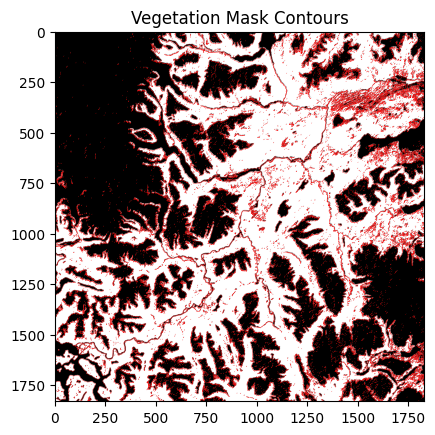

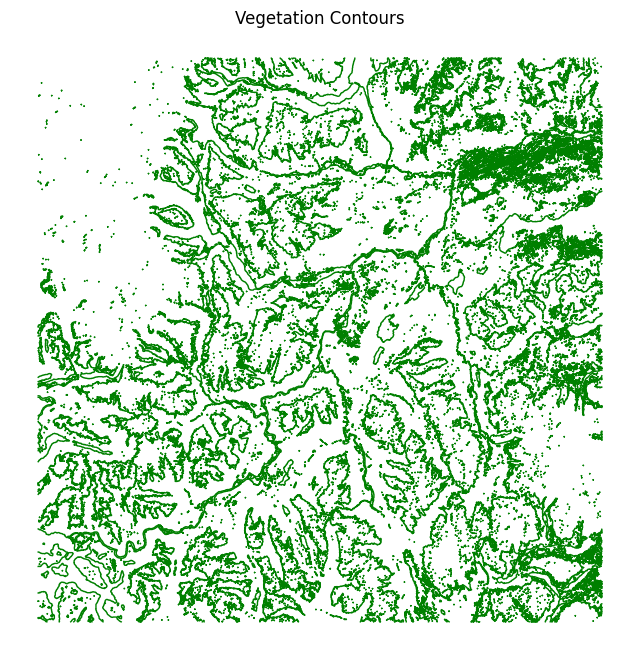

In [ ]:
contours = measure.find_contours(NDVIvegmask.astype(float), 0.5) #creates boundaries seperating values of above and below 0.5
# Plot the contours
fig, ax = plt.subplots()
ax.imshow(NDVIvegmask, cmap='gray')
for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=0.2, color='red')
plt.title("Vegetation Mask Contours")
plt.show()
plt.figure(figsize=(8, 8))
for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0], color='green', linewidth=1)

plt.gca().invert_yaxis()  # Invert Y to match image coordinates
plt.axis('equal')
plt.axis('off')
plt.title("Vegetation Contours")
plt.show()

#**Use Digital Elevation Model (DEM) corresponing to the area of study**
From NASADEM (30m resolution), found on opentopography.org

In [ ]:
DEMpath = '/content/drive/MyDrive/GEOL0069/Final Project/Data/output_beb.tif'
# Read the DEM
with rasterio.open(DEMpath) as src:
    DEM = src.read(1)  # Read the first band
    profile = src.profile

#Realign DEM to match that of the sentinel 2 data

In [ ]:
# Sentinel reference raster
sentinel_band_path = bands_paths['B4']  # any band will do, all are aligned
with rasterio.open(sentinel_band_path) as ref:
    s2_transform = ref.transform
    s2_crs = ref.crs
    s2_shape = ref.shape
with rasterio.open(DEMpath) as src_dem:
    dem_data = src_dem.read(1)
    dem_transform = src_dem.transform
    dem_crs = src_dem.crs
    dem_dtype = src_dem.dtypes[0]

# Create empty array for resampled DEM (same shape as Sentinel-2 band)
    aligned_dem = np.empty(s2_shape, dtype=dem_dtype)

    # Reproject and resample DEM to match Sentinel-2
    reproject(
        source=dem_data,
        destination=aligned_dem,
        src_transform=dem_transform,
        src_crs=dem_crs,
        dst_transform=s2_transform,
        dst_crs=s2_crs,
        resampling=Resampling.average  # average or bilinear are best for DEMs
    )

#Save this aligned DEM

In [ ]:
output_path = '/content/drive/MyDrive/GEOL0069/Final Project/Data/dem_60m_aligned.tif'

with rio_open(
    output_path, 'w',
    driver='GTiff',
    height=s2_shape[0],
    width=s2_shape[1],
    count=1,
    dtype=dem_dtype,
    crs=s2_crs,
    transform=s2_transform
) as dst:
    dst.write(aligned_dem, 1)


In [ ]:
#Ensure both sentinel 2 data and DEM are using the same coordinate system
print(srs)
with rasterio.open(output_path) as aligned_dem:
  print(aligned_dem.crs)

EPSG:32718
EPSG:32718


In [ ]:
# Read the DEM
with rasterio.open(output_path) as src:
    aligned_dem = src.read(1)  # Read the first band


# We can not plot the vegetation contours on to the DEM

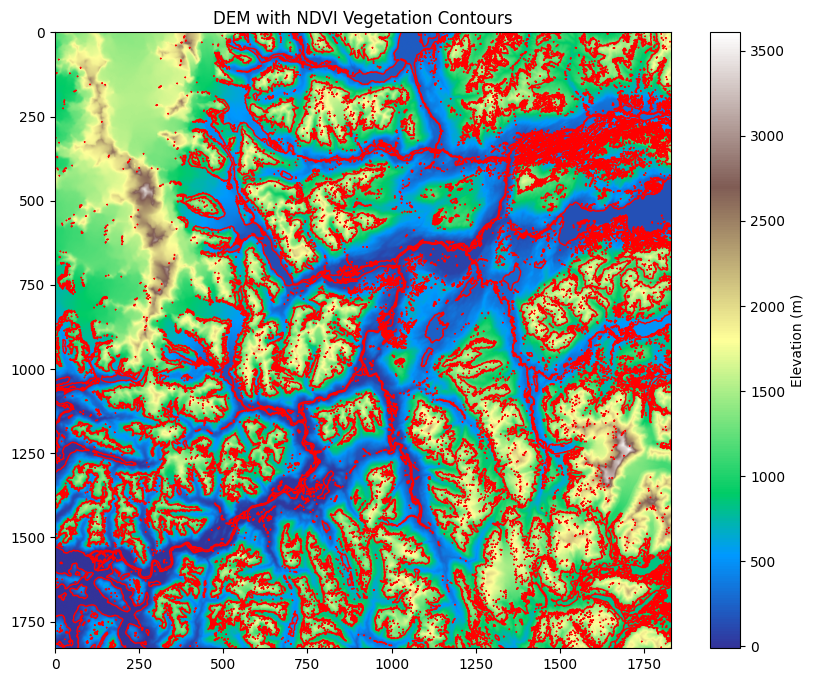

In [ ]:
# Plot DEM + contours
fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(aligned_dem, cmap='terrain')
for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], color='red', linewidth=1)
    # Add colorbar for DEM
cbar = fig.colorbar(im, ax=ax, label='Elevation (m)')
ax.set_title('DEM with NDVI Vegetation Contours')
plt.show()

#Turn contours into points

In [ ]:
# Suppose contours is your list of contour arrays
all_points = np.vstack(contours)  # stack all contour points into one big array (M, 2)

print(f"Total points from all contours: {all_points.shape[0]}")
print(all_points[:10])  # first 10 points


Total points from all contours: 337292
[[1.500e+00 5.410e+02]
 [1.000e+00 5.405e+02]
 [5.000e-01 5.410e+02]
 [1.000e+00 5.415e+02]
 [1.500e+00 5.410e+02]
 [0.000e+00 5.425e+02]
 [5.000e-01 5.420e+02]
 [0.000e+00 5.415e+02]
 [0.000e+00 5.445e+02]
 [1.000e+00 5.445e+02]]


#**Find elevation at each point at boundary of NDVI threshold**

In [ ]:
elevation = []
elevation = aligned_dem[all_points[:, 0].astype(int), all_points[:, 1].astype(int)]

### combine the point coordinates and elevation into one array

In [ ]:
# Make sure all_points and elevation are NumPy arrays
all_points = np.array(all_points)        # shape: (N, 2)
elevation = np.array(elevation)          # shape: (N,)

# Stack the data: shape will be (N, 3)
points = np.column_stack((all_points, elevation))

# Now you can index like this:
print(points[0, :])  # First point (x, y, elevation)

print(f"Total points from all contours: {points.shape[0]}")
print(points[:10])  # first 10 points


[   1.5  541.  1194. ]
Total points from all contours: 337292
[[1.500e+00 5.410e+02 1.194e+03]
 [1.000e+00 5.405e+02 1.258e+03]
 [5.000e-01 5.410e+02 1.163e+03]
 [1.000e+00 5.415e+02 1.194e+03]
 [1.500e+00 5.410e+02 1.194e+03]
 [0.000e+00 5.425e+02 1.114e+03]
 [5.000e-01 5.420e+02 1.114e+03]
 [0.000e+00 5.415e+02 1.163e+03]
 [0.000e+00 5.445e+02 1.043e+03]
 [1.000e+00 5.445e+02 1.059e+03]]


#We can plot the elevation of where NDVI crosses the threshold of 0.2

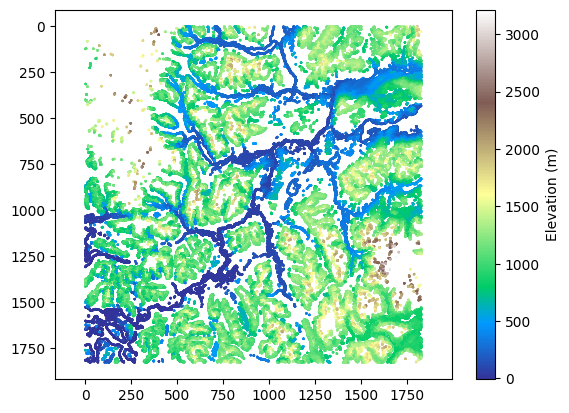

In [ ]:
plt.scatter(x= points[:,1],y= points[:,0],c=points[:,2],cmap='terrain',s=0.5)
plt.colorbar(label='Elevation (m)')
plt.gca().invert_yaxis()
plt.axis('equal')
plt.show()

#plot distribution of contour elevations

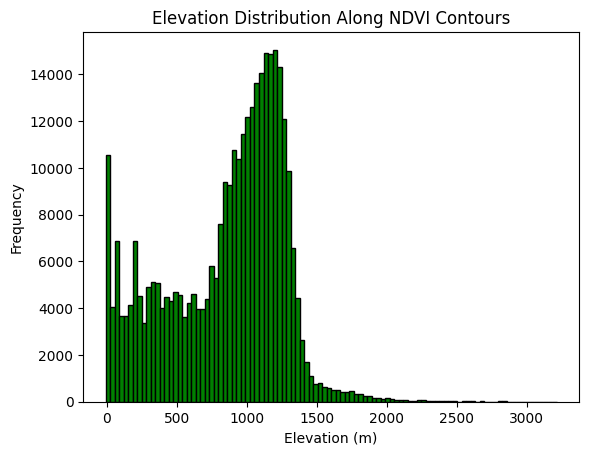

In [ ]:
plt.hist(elevation, bins=100, color='green', edgecolor='black')
plt.title("Elevation Distribution Along NDVI Contours")
plt.xlabel("Elevation (m)")
plt.ylabel("Frequency")
plt.grid(False)
plt.show()


# **To isolate upper vegetation contours we must calculate local relief**

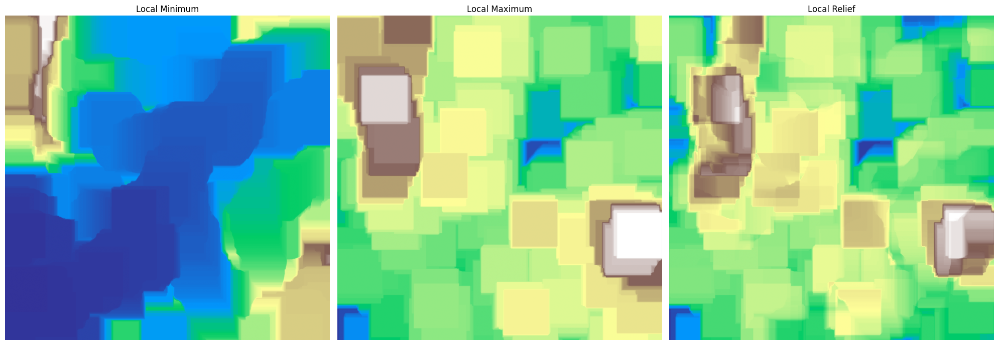

In [ ]:
window_size = 250 #using a broad window size in an attempt of negating the effects of valleys
local_max = maximum_filter(aligned_dem, size=window_size) #Calculate local maximum
local_min = minimum_filter(aligned_dem, size=window_size) #Calculate local minimum
local_relief = local_max - local_min #Calculate local relief

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 15))

# Plot local minimum
im0 = axs[0].imshow(local_min, cmap='terrain')
axs[0].set_title('Local Minimum')
axs[0].axis('off')

# Plot local maximum
im1 = axs[1].imshow(local_max, cmap='terrain')
axs[1].set_title('Local Maximum')
axs[1].axis('off')

# Plot local relief
im2 = axs[2].imshow(local_relief, cmap='terrain')
axs[2].set_title('Local Relief')
axs[2].axis('off')

plt.tight_layout()
plt.show()

# **Create a threshold as local min + relief/4 to discriminate between upper and lower boundaries**


In [ ]:
threshold = local_min + 0.25*local_relief # calculate threshold based on local minimum and relief
#Points above threshold
threshpoint = threshold[points[:, 1].astype(int), points[:, 0].astype(int)] #Finds the threshold value at ead of the contour points
upvalidpoint = np.where(points[:,2] >= threshpoint) #see if the point exceeds the threshold value at that position
upvalpoint = points[upvalidpoint] #A variable of only points that exceed their local threshold

#Points below threshold
threshpoint = threshold[points[:, 1].astype(int), points[:, 0].astype(int)] #Finds the threshold value at ead of the contour points
lowvalidpoint = np.where(points[:,2] <= threshpoint) #see if the point is less than the threshold value at that position
lowvalpoint = points[lowvalidpoint] #A variable of only points that are lower than their local threshold

# Plot which points exceed the threshold and their elevation
###It was difficult to perfect the threshold level as it is a function of minimum + x*relief, but also these factors are heavily dependent on the window size of relief calculations

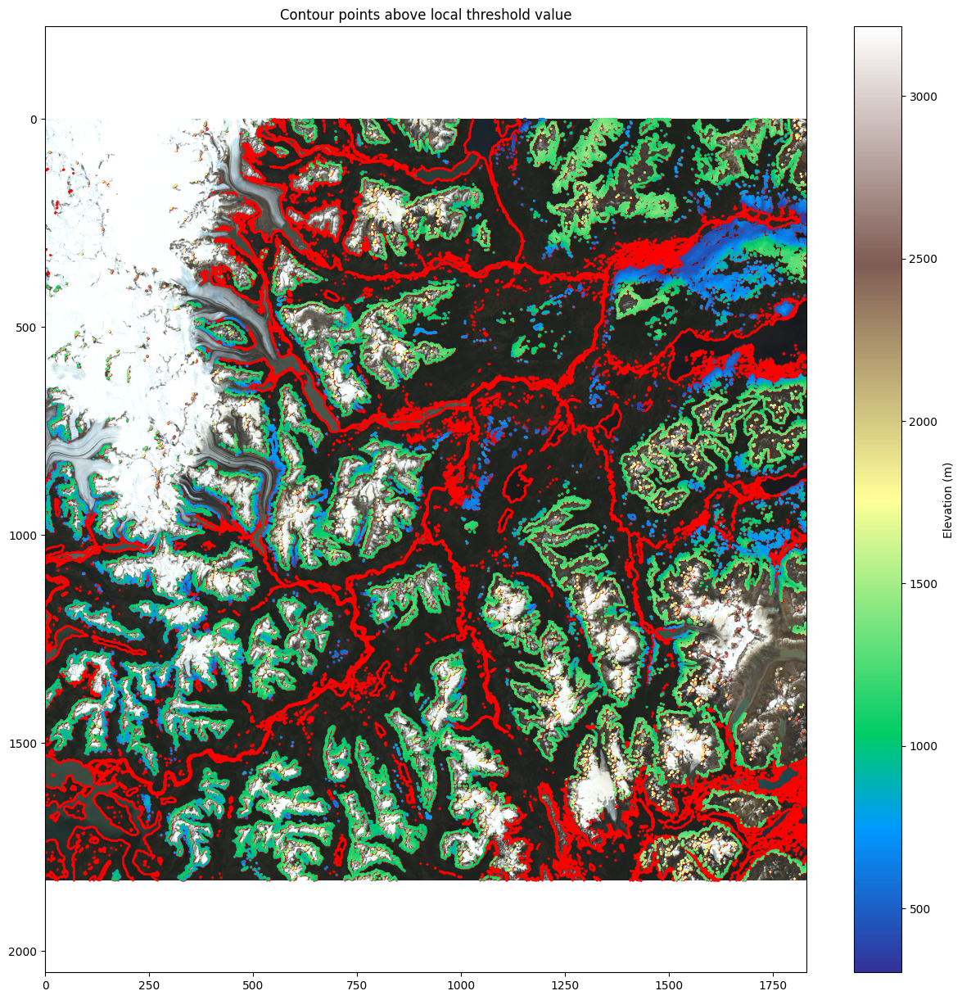

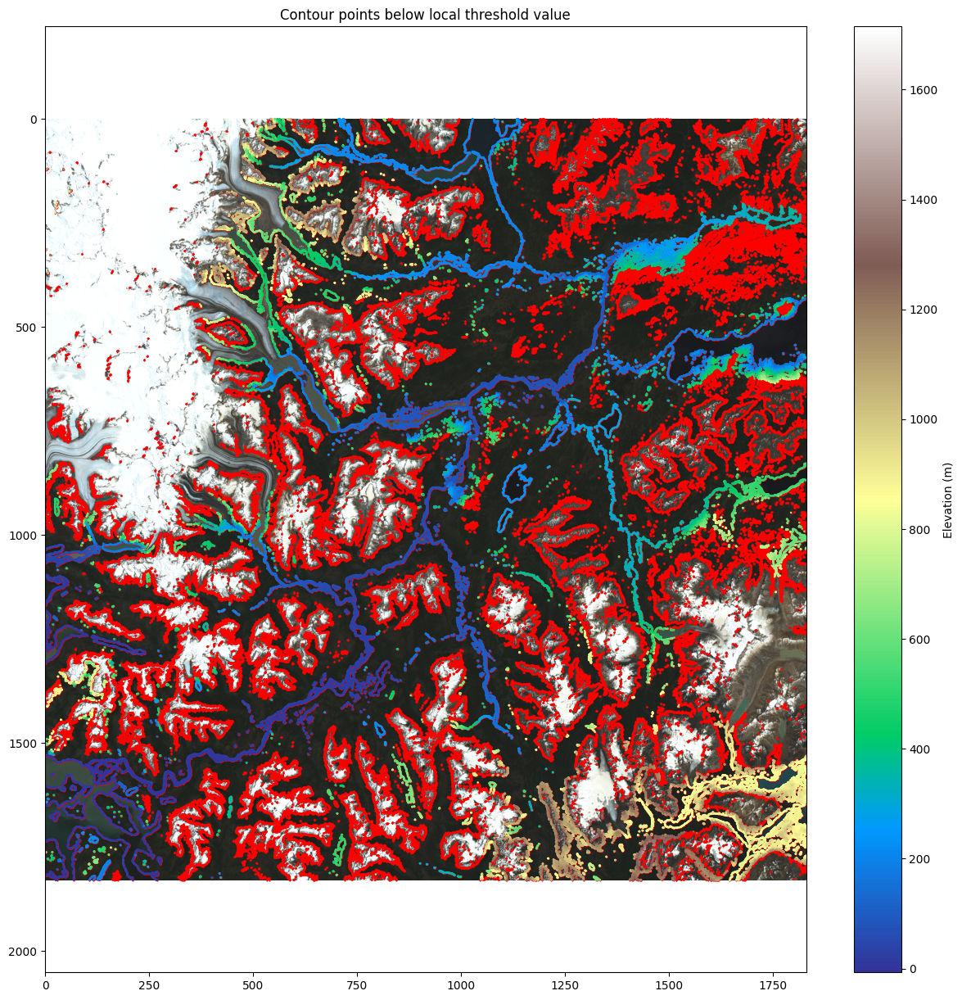

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(band_stackrgb)
plt.scatter(x= points[:,1],y=points[:,0],c='Red',s=0.25)
plt.scatter(x= upvalpoint[:,1],y= upvalpoint[:,0],c=upvalpoint[:,2],cmap='terrain',s=0.5)
plt.title('Contour points above local threshold value')
plt.colorbar(label='Elevation (m)')
#plt.gca().invert_yaxis()
plt.axis('equal')
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(band_stackrgb)
plt.scatter(x= points[:,1],y=points[:,0],c='Red',s=0.25)
plt.scatter(x= lowvalpoint[:,1],y= lowvalpoint[:,0],c=lowvalpoint[:,2],cmap='terrain',s=0.5)
plt.title('Contour points below local threshold value')
plt.colorbar(label='Elevation (m)')
#plt.gca().invert_yaxis()
plt.axis('equal')
plt.show()


#**Save this data to .csv file, so the it can be used in the next notebook for GPsat**

In [ ]:
# Example: Save a 2D array to CSV
np.savetxt("/content/drive/MyDrive/GEOL0069/Final Project/Data/upvalpoint.csv", upvalpoint, delimiter=",", fmt="%.6f", header="y,x,z", comments='')
np.savetxt("/content/drive/MyDrive/GEOL0069/Final Project/Data/lowvalpoint.csv", lowvalpoint, delimiter=",", fmt="%.6f", header="y,x,z",
    comments='')
